# Lane Detection Pipeline Based on OpenCV

The goals / steps of this project are the following:
* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


# Importing Necessecary Libs

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.pyplot import figure, imshow, axis
from matplotlib.image import imread

import numpy as np
import cv2
from glob import glob
import PIL.Image
from IPython.display import Image, HTML, display
import matplotlib.colors
import colorsys

import os
from os import listdir
from os.path import isfile, join

## Importing the necessary libs

import numpy as np
import pandas as pd
import csv
import cv2
import sklearn
import random, pylab

from moviepy.editor import VideoFileClip
from IPython.display import HTML

# Loading & Displaying Calibration & Test Images

In [2]:
## This API can display any list of images with corresponding lables
def display_DataSample(dataSet, file_names=None, cmap=None):
    fig = plt.figure(figsize=(30, 45))
    
    for i in range(len(dataSet)): 
        #index = random.randint(0, (len(dataSet)-1))
        image = dataSet[i]
        sub = fig.add_subplot(10, 2, i+1)
        sub.imshow(image, cmap, interpolation='nearest')
        #plt.title(file_names[index])
        
    fig.tight_layout()   
    plt.show()  
    
    return

In [3]:
##Import calibration images
calib_img_list = glob('camera_cal/*.jpg')
calib_img_list = list(map(mpimg.imread, calib_img_list))

##Import test images
test_img_list = glob('test_images/*.jpg')
test_img_list = list(map(mpimg.imread, test_img_list))

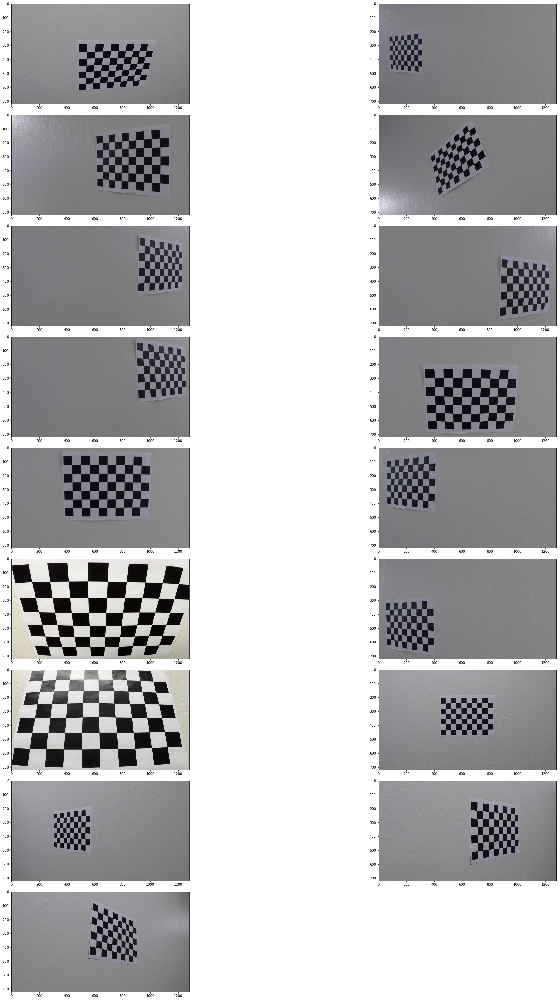

In [4]:
display_DataSample(calib_img_list)

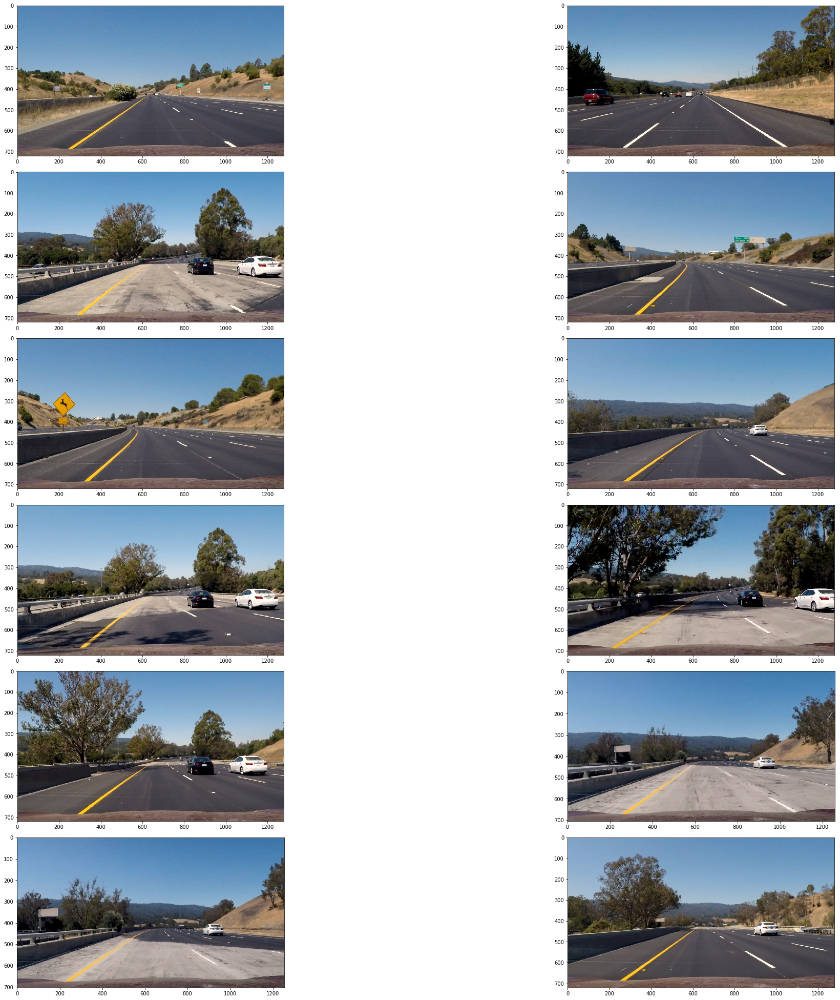

In [5]:
display_DataSample(test_img_list)

# Camera Calibration

Camera calibration step is intended to calculate some camera parameters which are used further in images undistortion process, these parameters are:
* Camera matrix.
* Distortion Coeffs.
* Camera position in the world in polar & cartesian coordinates. 

In [6]:
## Camera Calibration API
##Images 1,4,5 are neglected as they don't conform to the mesh grid (9,6) size

def camera_calib(calib_img_list):
    chess_length = 9
    chess_width = 6
    coordinates = 3
    
    objpoints = []
    imgpoints = []
    calib_output_list = []
    
    objp = np.zeros((chess_length * chess_width, coordinates), np.float32)
    objp[:,:2] = np.mgrid[0:chess_length, 0:chess_width].T.reshape(-1, 2)
    
    ## Aggregate imgpoints & objpoints from all the calibration images
    for i in range(len(calib_img_list)):
        
        gray = cv2.cvtColor(calib_img_list[i], cv2.COLOR_RGB2GRAY)   
        ret, corners = cv2.findChessboardCorners(gray, (chess_length,chess_width), None)
    
        #If corners are available add object & corner points
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)    
            calib_output_list.append(cv2.drawChessboardCorners(calib_img_list[i], (chess_length,chess_width), corners, ret))
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

    return  calib_output_list, mtx, dist

In [7]:
calib_output_list, mtx, dist = camera_calib(calib_img_list)

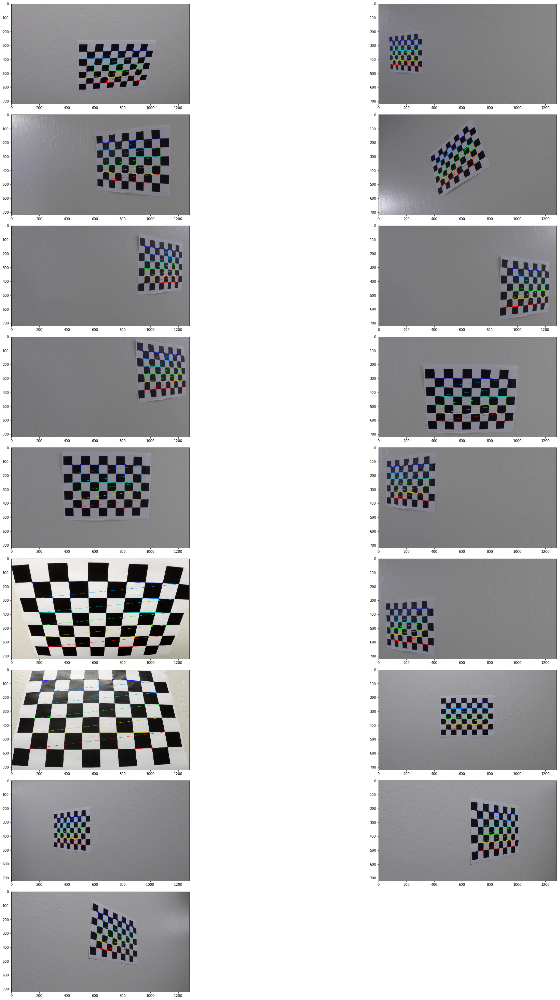

In [33]:
display_DataSample(calib_output_list)

# Image Undistortion

In [37]:
##Images Undistortion API

def undistort(img, mtx=mtx, dist=dist):
    
    undistorted_img = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undistorted_img

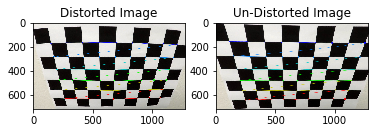

In [47]:
## Undistortion Example
undistorted_img_sample = undistort(calib_img_list[10])
plt.subplot(1,2,1)
plt.title("Distorted Image")
plt.imshow(calib_img_list[10])
plt.subplot(1,2,2)
plt.title("Un-Distorted Image")
plt.imshow(undistorted_img_sample)

# Lanes Extractor Pipeline

This the main pipeline I've started it by defining all the APIs I've tried on to make my pipeline performs better even if I ended up not using them.

# 1- Gradient & Color Spaces Combined Filters

In [9]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=None):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*(abs_sobel/np.max(abs_sobel)))
    
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    
    # Return the result
    return binary_output

In [10]:
# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

In [11]:
# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

In [12]:
##Create different combinatons of gradient magnitude and direction filters
def grad_combine(img,ksize=3):
    
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.7, 1.3))
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) & ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    return combined
    

In [87]:
# Define a function that thresholds the S-channel & L-channel of HLS color space
def hls_select(img, thresh_s=None, thresh_l=None):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    l_channel = hls[:,:,1]
    
    binary_output = np.zeros_like(s_channel)
    binary_output[((s_channel > thresh_s[0]) & (s_channel <= thresh_s[1])) & ((l_channel > thresh_l[0]) & (l_channel <= thresh_l[1]))] = 1
    
    #As you can see I've tried many combinations till reached to a satisfactory output
    #binary_output[((l_channel > thresh_l[0]) & (l_channel <= thresh_l[1]))] = 1
    #binary_output[((s_channel > thresh_s[0]) & (s_channel <= thresh_s[1]))] = 1
    
    return binary_output

In [88]:
## Define a function that combines gradient and color space filters
def grad_hls_combine(img, ksize=3):
    
    sl_binary = hls_select(img, thresh_s=(100, 255), thresh_l=(100, 255))
    sx_binary = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(100, 255))
    grad_comb = grad_combine(img,ksize=ksize)
    
    #As you can see I've tried many combinations of color channels and gradients and gradient thresholds till reached
    #a satisfactory output 
    binary_output = np.zeros_like(sl_binary)
    binary_output[(sl_binary == 1) | (sx_binary == 1)] = 1
    #binary_output[(sl_binary == 1)] = 1
    return binary_output

# Visualizing different preprocessing combinations

* As noticed I've added extra test images for the frames that showed bad detection output to catch the difficult detections from them.

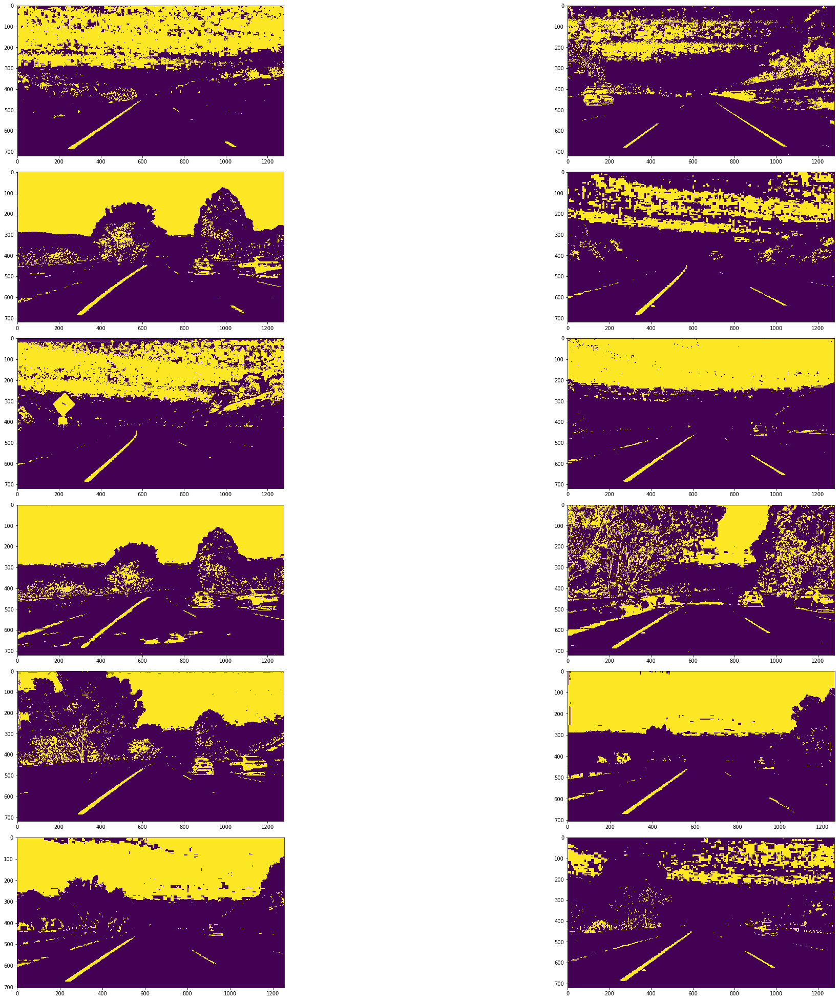

In [82]:
#1- S channel only output
#ksize_list = [3 for i in test_img_list]
binary_img_list = []
for i in range(len(test_img_list)):
    binary_img_list.append(grad_hls_combine(test_img_list[i], ksize=3))
                           
display_DataSample(binary_img_list)

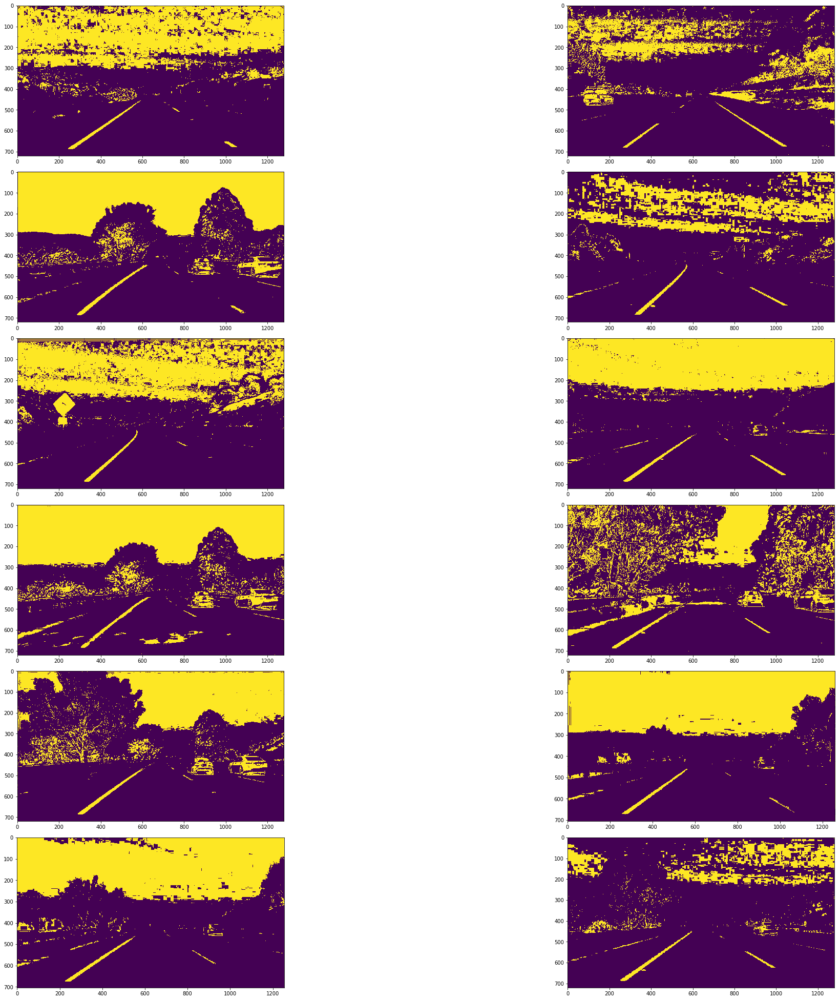

In [86]:
#2- combining S & sobel_x outputs
binary_img_list = []
for i in range(len(test_img_list)):
    binary_img_list.append(grad_hls_combine(test_img_list[i], ksize=3))
                           
display_DataSample(binary_img_list)

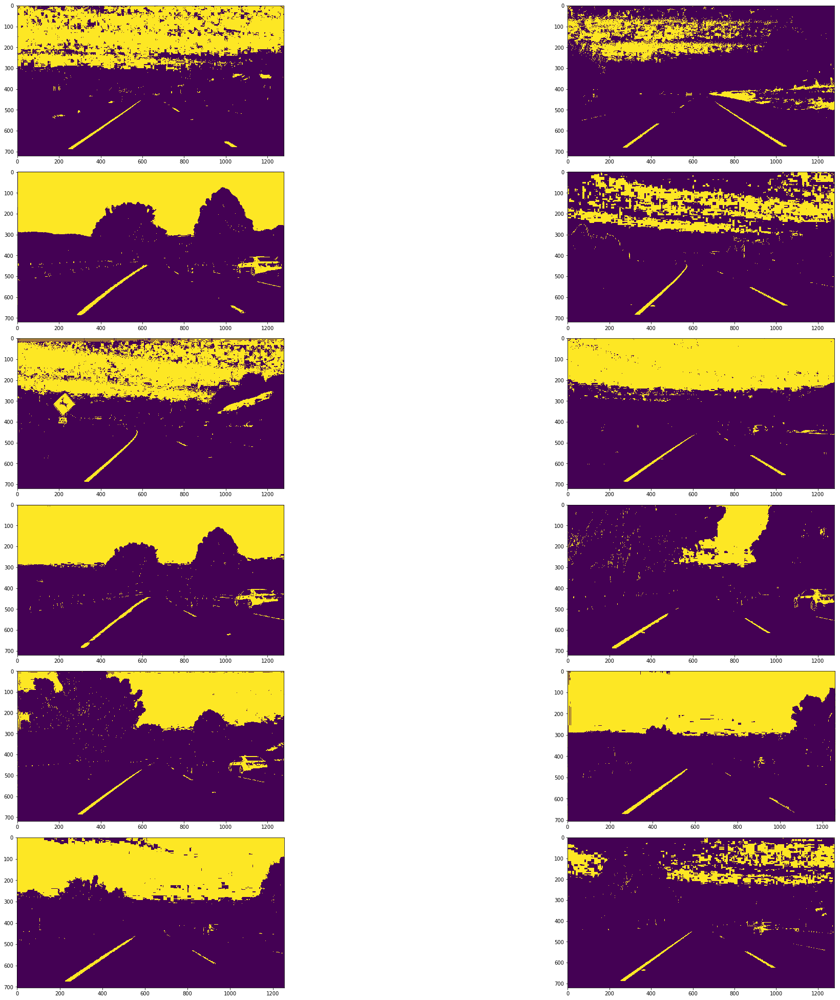

In [89]:
#3- combining S,L & sobel_x outputs to improve the detections of the ligh lane line, and also I've tuned(increased) the gradient
#threshold range to minimize the resulted noise as possible
binary_img_list = []
for i in range(len(test_img_list)):
    binary_img_list.append(grad_hls_combine(test_img_list[i], ksize=3))
                           
display_DataSample(binary_img_list)

# 2- Perspective Transformation

In [48]:
## Bird's Eye Perspective Transformation API
def persp_tarnsform(img):
    
    img_size = (img.shape[1], img.shape[0])

## Also, here I've tried many values for src & dist points and I chose to keep all of them for future enhancements in this 
#pipeline.

##These values are extracted manually from the test images by trial and error methodology 
    bottom_left_src = [210, 720]
    bottom_right_src = [1110, 720]
    top_left_src = [565, 470]
    top_right_src = [720, 470]
    
##These values are used as per some recommendations on Udacity forums     
    bottom_left = [320,720] 
    bottom_right = [920, 720]
    top_left = [320, 1]
    top_right = [920, 1]
    
    #src = np.float32([bottom_left_src,bottom_right_src,top_right_src,top_left_src])
    #dst = np.float32([bottom_left,bottom_right,top_right,top_left])
    
    ################
    w,h = 1280,720
    x,y = 0.5*w, 0.8*h
    src = np.float32([[200./1280*w,720./720*h],
                  [453./1280*w,547./720*h],
                  [835./1280*w,547./720*h],
                  [1100./1280*w,720./720*h]])
    dst = np.float32([[(w-x)/2.,h],
                  [(w-x)/2.,0.82*h],
                  [(w+x)/2.,0.82*h],
                  [(w+x)/2.,h]])

    
    ## Define the region of interest
    #src = np.float32([[190, 700], [1110, 700], [720, 470], [570, 470]])
    #
    #bottom_left = src[0][0]+100, src[0][1]
    #bottom_right = src[1][0]-200, src[1][1]
    #top_left = src[3][0]-250, 1
    #top_right = src[2][0]+200, 1
    #dst = np.float32([bottom_left, bottom_right, top_right, top_left])
    ################################
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    binary_warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    ## This is one of the methods I've tried to eliminate the noise on the image sides but it's not used for now.
    ## Neglect any data on the outer shelter of the image (shelter thickness = 50 pixels) as this segments are more likely to 
    ## cause unwanted noise
    #binary_warped[0:50, :] = 0
    #binary_warped[:, 0:50] = 0
    #binary_warped[(img.shape[0] - 50):img.shape[0], :] = 0
    #binary_warped[:, (img.shape[1] - 50):img.shape[1]] = 0
    
    return binary_warped , Minv

# Visualizing Bird's Eye View after the preprocessing

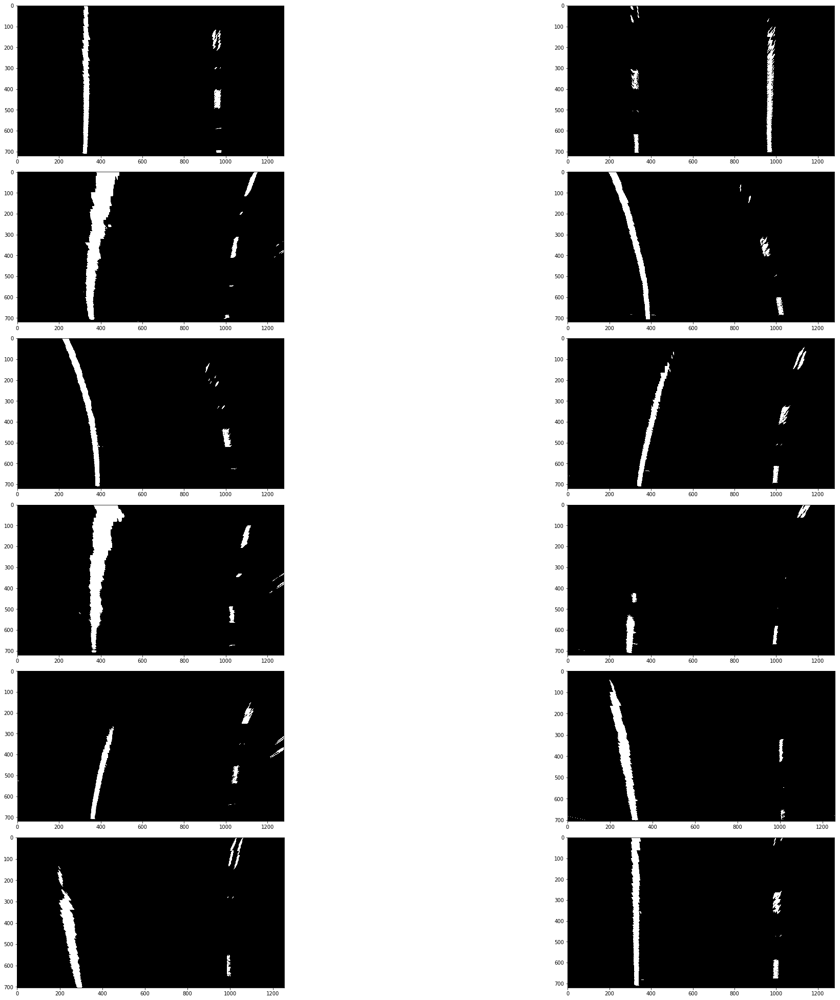

In [95]:
warped_img_list = []
for i in range(len(binary_img_list)):
    warped_img, M_inv = persp_tarnsform(binary_img_list[i])
    warped_img_list.append(warped_img)
                           
display_DataSample(warped_img_list, cmap='gray')

In [17]:
## This API is not used in my pipeline but it can show us the strong edges in the bottom half of the image graphically as shown 
## below
def img_hist(img):
    
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    plt.show()
    plt.plot(histogram)

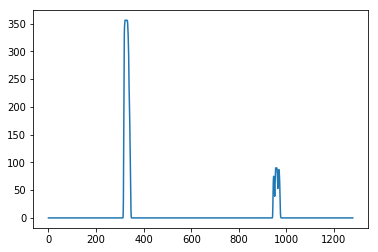

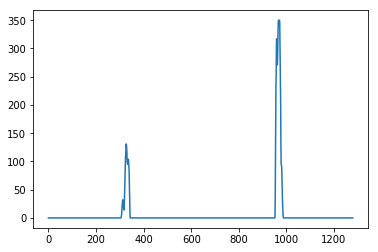

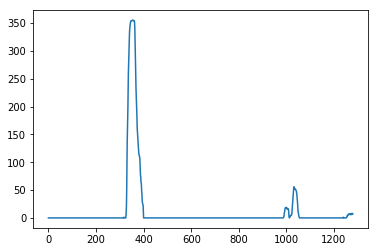

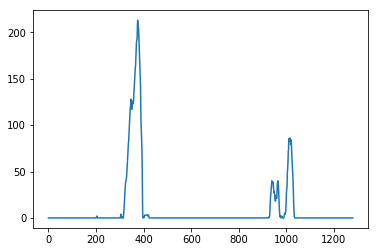

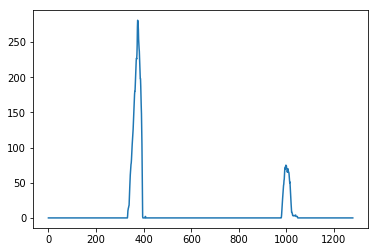

...

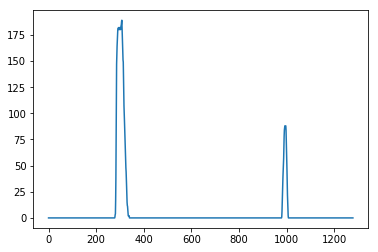

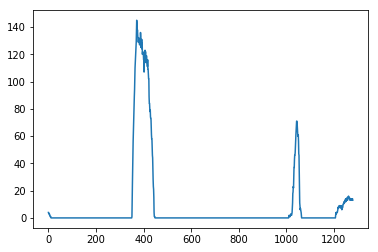

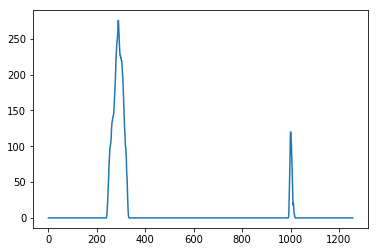

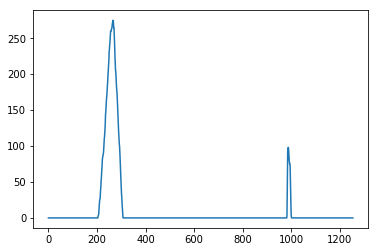

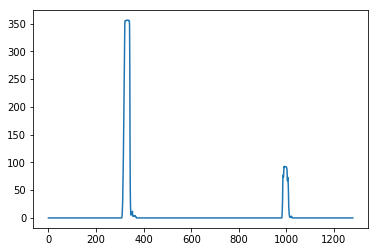

In [53]:
## Visulaizing preprocessed frames histograms

for i in range(len(test_img_list)):
    bird_eye_img , undistorted_img, M_inv = frame_processor(test_img_list[i])
    img_hist(bird_eye_img)

# The Main Pipeline APIs

In [16]:
## This API handles all the preprocessing of each frame
def frame_processor(img, ksize=3):
    
    undistorted_img = undistort(img)
    grad_hls_combine_img = grad_hls_combine(undistorted_img, ksize=ksize)
    bird_eye_img, Minv = persp_tarnsform(grad_hls_combine_img)
    
    return bird_eye_img , undistorted_img, Minv #Inverse camera matrix 

In [54]:
## this API applies the sliding window search approach for detecting the lane lines without dependency on a previous fitted polynomials
def blind_slide_window_detector(binary_warped):
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    ##No need for them for now
    #plt.imshow(out_img)
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    #plt.xlim(0, 1280)
    #plt.ylim(720, 0)
    
    return out_img, ploty, left_fit, right_fit, left_fitx, right_fitx, left_lane_inds, right_lane_inds

In [57]:
def slide_window_detector(binary_warped, left_fit, right_fit):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    
    ############################################
    ##############################################
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    ##No need for them for now
    #plt.imshow(result)
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    #plt.xlim(0, 1280)
    #plt.ylim(720, 0)
    
    return result, ploty, left_fit, right_fit, left_fitx, right_fitx, left_lane_inds, right_lane_inds

In [58]:
# this API fills/highlight the region of interest depending on the sliding window search results
def lane_highlight(binary_warped, undistorted_img, ploty, left_x, right_x, Minv):

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_x, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_x, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (color_warp.shape[1], color_warp.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted_img, 1, newwarp, 0.3, 0)
                    
    return result

In [59]:
## this API Determines the lane curvature & shifting from the lane center of each frame
def lane_curvature(lane_img, ploty, leftx, rightx):

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    ## Identify the x and y positions of all nonzero pixels in the image
    #nonzero = lane_img.nonzero()
    #nonzeroy = np.array(nonzero[0])
    #nonzerox = np.array(nonzero[1])
    ## Again, extract left and right line pixel positions
    #leftx = nonzerox[left_lane_inds]
    #lefty = nonzeroy[left_lane_inds] 
    #rightx = nonzerox[right_lane_inds]
    #righty = nonzeroy[right_lane_inds]
    
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters    
    
    current_lane_curvature = (left_curverad + right_curverad) / 2
    
    ## Determining the shifting of the vehicle center from the lane center line
    ##Note that I've assumed here that the image center indicates the vehicle center (Assumed that camera is centered in the
    ##vehicle front)
    camera_img_center = np.uint16(lane_img.shape[1]/2)
    #print(camera_img_center)
    left_spacing = []
    right_spacing = []
    shif_spac = []
    for i in range(10):
        rand_index = random.randint(0, (len(leftx)-1))
        left_spacing.append(camera_img_center - leftx[rand_index])
        right_spacing.append(rightx[rand_index] - camera_img_center)
        
    shift_space = [x-y for (x,y) in zip(left_spacing, right_spacing)]
    
    #print(shift_space)    
    veh_shift_m = (sum(shift_space)/10) * xm_per_pix
    #print(veh_shift_m)
    if veh_shift_m > 0:
        cv2.putText(lane_img, "Vehicle is %.3f meters left of the lane center" % abs(veh_shift_m), (250, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255,255), 4)
    elif veh_shift_m < 0:
        cv2.putText(lane_img, "Vehicle is %.3f meters right of the lane center" % abs(veh_shift_m), (250, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255,255), 4)
    else:
        cv2.putText(lane_img, "Vehicle is centered on the lane", (250, 300), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255,255), 4)
       
    cv2.putText(lane_img, "Current Radius of Curvature = %.2f Meters" % current_lane_curvature, (250, 100), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255,255,255), 4)
    #plt.imshow(lane_img)
    return current_lane_curvature, lane_img


In [60]:
## This API applies three helpful sanity chck on each frame results: 
## 1- Assuring that there's not a big "Not logical" change between the current and prev lane curvature with an allowable margin of
# change = 50 m.
# 2- Assuring that the lane lines spacing is with acceptable deviation from the standard spacing: +/- 1m.
# 3- Assuring that the lane lines slopes are roughly within range by determing the slopes of random sets of left & right line 
# points and getting their average.

def sanity_checks(current_lane_curvature, prev_lane_curvature, left_fit, right_fit, left_x, right_x):
    
    ##1- Curvature check
    
    if np.float32(abs(np.float32(current_lane_curvature) - prev_lane_curvature)) < 50:
        curvature_check = True
    else:   
        curvature_check = False
        
        
    ##2- Lane lines spacing
    
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    lane_width_pxl = []
    min_lane_width = 3.7
    
    for i in range(10):
        rand_index = random.randint(0, (len(left_x)-1))
        lane_width_pxl.append(right_x[rand_index] - left_x[rand_index])
    
    avrg_width_m = (sum(lane_width_pxl)/10) * xm_per_pix
    
    if  ((min_lane_width - 1) < avrg_width_m < (min_lane_width + 1)):
        lanes_spacing = True
    else:
        lanes_spacing = False
    
    
    ##3- Lane lines parallelism
    
    left_slope_list = []
    right_slope_list = []
    for i in range(10):
        rand_index = random.randint(0, (len(left_x)-1))
        left_slope_list.append(2*left_fit[0]*left_x[rand_index] + left_fit[1])
        right_slope_list.append(2*right_fit[0]*right_x[rand_index] + right_fit[1])
    
    left_slope = sum(left_slope_list)/len(left_slope_list)
    right_slope = sum(right_slope_list)/len(right_slope_list)
    
    if np.float32(abs(np.float32(left_slope - right_slope))) < 0.5:
        slope_check = True
    else:
        slope_check = False
        
    return curvature_check, lanes_spacing, slope_check

In [61]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xleftfitted = [] 
        self.recent_xrightfitted = []
        #average x values of the fitted line over the last n iterations
        self.bestx_left = []
        self.bestx_right = []
        #polynomial coefficients and the averaged fits over the last n iterations
        self.rightfit = [] 
        self.leftfit = []
        
        self.best_rightfit = [] 
        self.best_leftfit = []
        
        #left & right lane inds
        self.left_lane_inds = []
        self.right_lane_inds = []
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = 500 ##Initial value
        #distance in meters of vehicle center from the line
        self.line_base_pos = [] 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = []  
        #y values for detected line pixels
        self.ally = []
        #smoothing n iteration counter
        self.iter_cntr = 0
        #Sanity check failure counter
        self.failed = 0
        

In [25]:
## Creating line object to save the latest detections
line = Line()

def lane_detect_withSMOOTHING(img):
    
    ## Number of last frames detections to be smoothed with the new detection
    smoothing_frames_nb = 10
    
    ## Camera is now calibrated and the frame is ready for the preprocessing 
    processed_frame, undistorted_img, Minv = frame_processor(img)

    ## If the previous detections passed the sanity checks then we'll use the saved polynomials left_fitBlind, right_fitBlind
    ## Otherwise the a blind search will start again from scratch
    if line.detected is False:    
        result_imgBlind, plotyBlind, left_fitBlind, right_fitBlind, left_xBlind, right_xBlind, line.left_lane_inds, line.right_lane_inds = blind_slide_window_detector(processed_frame)    
        
        line.recent_xleftfitted.append(left_xBlind)  
        line.recent_xrightfitted.append(right_xBlind)
        line.leftfit.append(left_fitBlind)
        line.rightfit.append(right_fitBlind)
        line.ally = plotyBlind
        line.iter_cntr+=1
        
    else:
        result_img, ploty, left_fit, right_fit, left_x, right_x, line.left_lane_inds, line.right_lane_inds = slide_window_detector(processed_frame, np.asarray(line.best_leftfit), np.asarray(line.best_rightfit))        
       
        line.recent_xleftfitted.append(left_x)
        line.recent_xrightfitted.append(right_x)
        line.leftfit.append(left_fit)
        line.rightfit.append(right_fit)
        line.ally = ploty
        line.iter_cntr+=1
    
        
    # Detections Smoothing
    if line.iter_cntr > smoothing_frames_nb:
        for i in range(smoothing_frames_nb):
            line.bestx_left =  [m+n for (m,n) in zip(line.bestx_left, line.recent_xleftfitted[-(i+1)])]
            line.bestx_right =  [m+n for (m,n) in zip(line.bestx_right, line.recent_xrightfitted[-(i+1)])]
            
            line.best_leftfit = [m+n for (m,n) in zip(line.best_leftfit, line.leftfit[-(i+1)])]
            line.best_rightfit = [m+n for (m,n) in zip(line.best_rightfit, line.rightfit[-(i+1)])]
        
        line.bestx_left = [x/smoothing_frames_nb for x in line.bestx_left]
        line.bestx_right = [x/smoothing_frames_nb for x in line.bestx_right]
        
        line.best_leftfit = [x/smoothing_frames_nb for x in line.best_leftfit]
        line.best_rightfit = [x/smoothing_frames_nb for x in line.best_rightfit]
        
    else:
    line.bestx_left = line.recent_xleftfitted[line.iter_cntr-1]
    line.bestx_right = line.recent_xrightfitted[line.iter_cntr-1]
            
    line.best_leftfit = line.leftfit[line.iter_cntr-1]
    line.best_rightfit = line.rightfit[line.iter_cntr-1]
        
        
    ## Updating RoC & Lane Highlighting
    prev_lane_curvature = line.radius_of_curvature
    lane_img = lane_highlight(processed_frame, undistorted_img, line.ally,  np.asarray(line.bestx_left), np.asarray(line.bestx_right), Minv)
    current_lane_curvature, lane_img = lane_curvature(lane_img, line.ally, np.asarray(line.bestx_left), np.asarray(line.bestx_right))
    line.radius_of_curvature = current_lane_curvature
    
    ##Sanity checks for the next frame processing
    curvature_check, lanes_spacing, slope_check = sanity_checks(current_lane_curvature, prev_lane_curvature, np.asarray(line.best_leftfit), np.asarray(line.best_rightfit), line.bestx_left, line.bestx_right)
    
    ## Deciding whether to start the window blind search again or not
    ## I belive from my debugging experience with this pipeline that lanes_spacing & slope_check sanity checks are more sensitive
    #and suspective to failure so I reduced their impact on the detections confidence to 50% of curvature_check impact.
    if (curvature_check & (lanes_spacing | slope_check)):
        
        line.detected = True
    else:
        line.detected = False
    
    
    ## Removing old redundant detections continousely
    if(line.iter_cntr > (2*smoothing_frames_nb)):
        line.recent_xleftfitted = line.recent_xleftfitted[smoothing_frames_nb::]
        line.recent_xrightfitted = line.recent_xrightfitted[smoothing_frames_nb::]
        line.leftfit = line.leftfit[smoothing_frames_nb::]
        line.rightfit = line.rightfit[smoothing_frames_nb::]
        line.iter_cntr = 0
        
    return lane_img
         

In [29]:
## Creating line object to save the latest detections
line = Line()

## This API should perfom the lane detection without performing the smoothing process and this is what I finally used as I 
#didn't experienced a noticable enhancement using the smoothing step.

def lane_detect(img):
        
    ## Camera is now calibrated and the frame is ready for the preprocessing 
    processed_frame, undistorted_img, Minv = frame_processor(img)

    if line.detected is False:  
        
        result_imgBlind, plotyBlind, left_fitBlind, right_fitBlind, left_xBlind, right_xBlind, line.left_lane_inds, line.right_lane_inds = blind_slide_window_detector(processed_frame)    
        
        line.bestx_left = left_xBlind
        line.bestx_right = right_xBlind
                
        line.best_leftfit = left_fitBlind
        line.best_rightfit = right_fitBlind
        
        line.ally = plotyBlind
        
    else:
        result_img, ploty, left_fit, right_fit, left_x, right_x, line.left_lane_inds, line.right_lane_inds = slide_window_detector(processed_frame, np.asarray(line.best_leftfit), np.asarray(line.best_rightfit))        

        line.bestx_left = left_x
        line.bestx_right = right_x
                
        line.best_leftfit = left_fit
        line.best_rightfit = right_fit
        
        line.ally = ploty    
    
           
    ## Updating RoC & Lane Highlighting
    prev_lane_curvature = line.radius_of_curvature
    lane_img = lane_highlight(processed_frame, undistorted_img, line.ally,  np.asarray(line.bestx_left), np.asarray(line.bestx_right), Minv)
    current_lane_curvature, lane_img = lane_curvature(lane_img, line.ally, np.asarray(line.bestx_left), np.asarray(line.bestx_right))
    line.radius_of_curvature = current_lane_curvature
    
    ##Sanity checks for the next frame processing
    curvature_check, lanes_spacing, slope_check = sanity_checks(current_lane_curvature, prev_lane_curvature, np.asarray(line.best_leftfit), np.asarray(line.best_rightfit), line.bestx_left, line.bestx_right)
    
    ## Deciding whether to start the window blind search again or not
    if (curvature_check & (lanes_spacing | slope_check)):
        
        line.detected = True
    else:
        line.detected = False
    
    return lane_img

In [30]:
## Specifying the output file
white_output = 'test_videos_output/project_output.mp4'
##Passing in the project video 
clip1 = VideoFileClip("project_video.mp4")
##Run the Lane Detection pipeline on each frame
white_clip = clip1.fl_image(lane_detect) 
%time white_clip.write_videofile(white_output, audio=False)


[MoviePy] >>>> Building video test_videos_output/project_26.mp4
[MoviePy] Writing video test_videos_output/project_26.mp4



 29%|███████████▌                            | 101/351 [00:29<01:15,  3.30it/s]


 58%|███████████████████████▏                | 203/351 [01:00<00:47,  3.13it/s]


 87%|██████████████████████████████████▊     | 305/351 [01:30<00:13,  3.52it/s]


100%|███████████████████████████████████████▉| 350/351 [01:43<00:00,  3.51it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_26.mp4 

Wall time: 1min 45s


# A Full Example of a Test Image goes through my pipeline and displaying the 
# output after each step

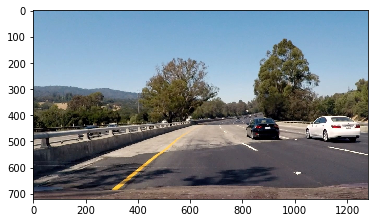

In [100]:
plt.imshow(test_img_list[6])

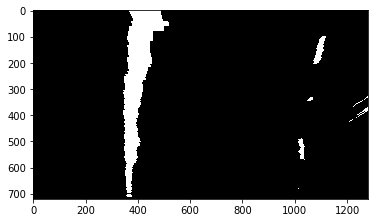

In [96]:
processed_frame, undistorted_img, Minv = frame_processor(test_img_list[6])
plt.imshow(processed_frame, cmap='gray')

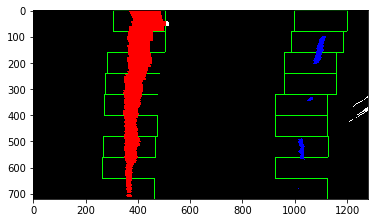

In [97]:
out_img, ploty, left_fit, right_fit, left_fitx, right_fitx, left_lane_inds, right_lane_inds = blind_slide_window_detector(processed_frame)
plt.imshow(out_img, cmap='gray')

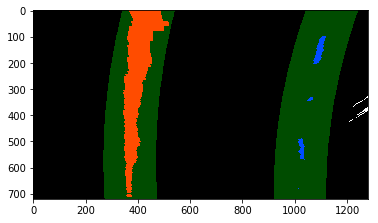

In [98]:
result, ploty, left_fit, right_fit, left_x, right_x, left_lane_inds, right_lane_inds = slide_window_detector(processed_frame, left_fit, right_fit)
plt.imshow(result)

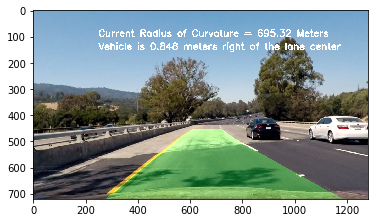

In [99]:
lane_img = lane_highlight(processed_frame, undistorted_img, ploty, left_x, right_x, Minv)
img,  curve= lane_curvature(lane_img, ploty, left_x, right_x)
plt.imshow(lane_img)

You've reached the end of this Notebook! :D 